In [96]:
import os 
import numpy as np 
import cv2
import glob
import tensorflow as tf
from tqdm import tqdm
from tensorflow.keras.models import Model
import re
import pydicom
from PIL import Image
import numpy as np
import dicom2jpg
import shutil
from scipy.ndimage import label
from tensorflow.keras.preprocessing import image


In [97]:
def create_dir(path):
    if not os.path.exists(path):
        os.makedirs(path)


def delete_all_files(folder_path):
    for root, dirs, files in os.walk(folder_path):
        for file_name in files:
            # Construct the full file path
            file_path = os.path.join(root, file_name)
            # Check if it's a file (not a directory)
            if os.path.isfile(file_path):
                # Delete the file
                os.remove(file_path)

    

    

In [98]:


inputdir = '/home/keanuf/.cache/Assignemt9/BRAIN SEGMENTATION/FULL_BRAIN/testDicom'
temp = 'temp'



#os.mkdir(outdir)
create_dir(temp)
delete_all_files(temp)

dicom2jpg.dicom2png(inputdir, temp) 

True

In [99]:




def find_and_copy_png_files(source_dir, destination_dir):
    # Walk through all directories and subdirectories in the source directory
    for root, dirs, files in os.walk(source_dir):
        for file in files:
            # Check if the file is a PNG file
            if file.lower().endswith('.png'):
                # Copy the PNG file to the destination directory
                shutil.copy2(os.path.join(root, file), destination_dir)

# Specify the source directory containing the folders
source_directory = temp

# Specify the destination directory to save the PNG files
outdir = "PNG_images"
create_dir(outdir)
# Call the function to find and copy PNG files
find_and_copy_png_files(source_directory, outdir)

print("PNG files copied successfully.")
delete_all_files(source_directory)

PNG files copied successfully.


In [100]:
items = os.listdir(inputdir)
first_item_path=""
if items:
    first_item = items[0]
    first_item_path = os.path.abspath(os.path.join(inputdir, first_item))
    first_item_path_raw = r"{}".format(first_item_path)
    print("Full path to the first item (raw string):", first_item_path_raw)
else:
    print("The folder is empty.")

Full path to the first item (raw string): /home/keanuf/.cache/Assignemt9/BRAIN SEGMENTATION/FULL_BRAIN/testDicom/ADNI_014_S_4615_PT_ADNI_Brain_PET__Raw_FDG_br_raw_20120430125415015_178_S148692_I301125.dcm


In [101]:
dicom_file_path = first_item_path

# Read the DICOM file
dicom_data = pydicom.dcmread(dicom_file_path)

# Extract patient information
patient_info = {
    "Patient Name": dicom_data.get("PatientName", "N/A"),
    "Patient ID": dicom_data.get("PatientID", "N/A"),
    "Patient Birth Date": dicom_data.get("PatientBirthDate", "N/A"),
    "Patient Sex": dicom_data.get("PatientSex", "N/A"),
    "Patient Age": dicom_data.get("PatientAge", "N/A"),
    "Patient Weight": dicom_data.get("PatientWeight", "N/A"),
    "Patient Address": dicom_data.get("PatientAddress", "N/A"),
}

# Print patient information
for key, value in patient_info.items():
    print(f"{key}: {value}")

Patient Name: 014_S_4615
Patient ID: 014_S_4615
Patient Birth Date: N/A
Patient Sex: M
Patient Age: N/A
Patient Weight: 88.45
Patient Address: N/A


In [102]:
test_path=outdir
directory = test_path
import os
import re
def natural_sort_key(s):
    """ Sort string in a human-readable way, handling numbers correctly. """
    return [int(text) if text.isdigit() else text.lower() for text in re.split('([0-9]+)', s)]

# Get a list of all the png files in the directory
files = [f for f in os.listdir(directory) if f.endswith('.png')]
files.sort(key=natural_sort_key)

# Rename each file
for i, filename in enumerate(files):
    new_name = f"{i}.png"
    os.rename(os.path.join(directory, filename), os.path.join(directory, new_name))



In [103]:
dataset_path = os.path.join("dataset", "aug")
files_dir= os.path.join("files", "aug")
model_file=os.path.join(files_dir, "unet_FULL_BRAIN.h5")
prediction_file=os.path.join(files_dir, "brainmodel.h5")








create_dir(files_dir)

In [104]:
save_path= "prediction"
create_dir(save_path)
model2=tf.keras.models.load_model(model_file)
model2.summary()



Model: "UNET"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 128, 128, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_19 (Conv2D)             (None, 128, 128, 64  1792        ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization_18 (BatchN  (None, 128, 128, 64  256        ['conv2d_19[0][0]']              
 ormalization)                  )                                                              

In [105]:

test_x=sorted(glob.glob(os.path.join(outdir,"*")))

print(len(test_x))
time_taken=[]
import time
for x in tqdm(test_x):
    name=x.split("/")[-1]
    print(name)
    x= cv2.imread(x ,cv2.IMREAD_COLOR)
    x=x / 255.0
    x=np.expand_dims(x,axis=0)
    start_time=time.time()
    p= model2.predict(x)[0]
    total_time=time.time()-start_time
    time_taken.append(total_time)
    p=p>0.5
    p=p*255
    cv2.imwrite(os.path.join(save_path, name),p)


540


  0%|          | 0/540 [00:00<?, ?it/s]

0.png
1/1 [==============================] - 0s 446ms/step


  0%|          | 1/540 [00:00<04:23,  2.05it/s]

1.png
1/1 [==============================] - 0s 23ms/step
10.png
1/1 [==============================] - 0s 26ms/step


  1%|          | 3/540 [00:00<01:42,  5.23it/s]

100.png
1/1 [==============================] - 0s 32ms/step
101.png
1/1 [==============================] - 0s 31ms/step


  1%|          | 5/540 [00:00<01:09,  7.67it/s]

102.png
1/1 [==============================] - 0s 27ms/step
103.png
1/1 [==============================] - 0s 24ms/step


  1%|▏         | 7/540 [00:00<00:54,  9.69it/s]

104.png
1/1 [==============================] - 0s 31ms/step
105.png
1/1 [==============================] - 0s 30ms/step


  2%|▏         | 9/540 [00:01<00:47, 11.25it/s]

106.png
1/1 [==============================] - 0s 32ms/step
107.png
1/1 [==============================] - 0s 28ms/step


  2%|▏         | 11/540 [00:01<00:42, 12.32it/s]

108.png
1/1 [==============================] - 0s 28ms/step
109.png
1/1 [==============================] - 0s 24ms/step


  2%|▏         | 13/540 [00:01<00:40, 13.16it/s]

11.png
1/1 [==============================] - 0s 23ms/step
110.png
1/1 [==============================] - 0s 23ms/step


  3%|▎         | 15/540 [00:01<00:37, 13.82it/s]

111.png
1/1 [==============================] - 0s 23ms/step
112.png
1/1 [==============================] - 0s 23ms/step


  3%|▎         | 17/540 [00:01<00:35, 14.60it/s]

113.png
1/1 [==============================] - 0s 29ms/step
114.png
1/1 [==============================] - 0s 22ms/step


  4%|▎         | 19/540 [00:01<00:34, 15.13it/s]

115.png
1/1 [==============================] - 0s 27ms/step
116.png
1/1 [==============================] - 0s 31ms/step


  4%|▍         | 21/540 [00:01<00:33, 15.27it/s]

117.png
1/1 [==============================] - 0s 31ms/step
118.png
1/1 [==============================] - 0s 27ms/step


  4%|▍         | 23/540 [00:01<00:34, 14.81it/s]

119.png
1/1 [==============================] - 0s 28ms/step
12.png
1/1 [==============================] - 0s 31ms/step


  5%|▍         | 25/540 [00:02<00:35, 14.31it/s]

120.png
1/1 [==============================] - 0s 32ms/step
121.png
1/1 [==============================] - 0s 39ms/step


  5%|▌         | 27/540 [00:02<00:36, 14.22it/s]

122.png
1/1 [==============================] - 0s 33ms/step
123.png
1/1 [==============================] - 0s 35ms/step


  5%|▌         | 29/540 [00:02<00:36, 13.93it/s]

124.png
1/1 [==============================] - 0s 31ms/step
125.png
1/1 [==============================] - 0s 27ms/step


  6%|▌         | 31/540 [00:02<00:35, 14.20it/s]

126.png
1/1 [==============================] - 0s 32ms/step
127.png
1/1 [==============================] - 0s 29ms/step


  6%|▌         | 33/540 [00:02<00:35, 14.35it/s]

128.png
1/1 [==============================] - 0s 26ms/step
129.png
1/1 [==============================] - 0s 31ms/step


  6%|▋         | 35/540 [00:02<00:35, 14.19it/s]

13.png
1/1 [==============================] - 0s 28ms/step
130.png
1/1 [==============================] - 0s 24ms/step


  7%|▋         | 37/540 [00:02<00:33, 14.80it/s]

131.png
1/1 [==============================] - 0s 25ms/step
132.png
1/1 [==============================] - 0s 32ms/step


  7%|▋         | 39/540 [00:03<00:33, 15.15it/s]

133.png
1/1 [==============================] - 0s 32ms/step
134.png
1/1 [==============================] - 0s 30ms/step


  8%|▊         | 41/540 [00:03<00:32, 15.57it/s]

135.png
1/1 [==============================] - 0s 27ms/step
136.png
1/1 [==============================] - 0s 34ms/step


  8%|▊         | 43/540 [00:03<00:32, 15.48it/s]

137.png
1/1 [==============================] - 0s 30ms/step
138.png
1/1 [==============================] - 0s 39ms/step


  8%|▊         | 45/540 [00:03<00:33, 14.68it/s]

139.png
1/1 [==============================] - 0s 39ms/step
14.png
1/1 [==============================] - 0s 27ms/step


  9%|▊         | 47/540 [00:03<00:35, 14.06it/s]

140.png
1/1 [==============================] - 0s 27ms/step
141.png
1/1 [==============================] - 0s 24ms/step


  9%|▉         | 49/540 [00:03<00:33, 14.67it/s]

142.png
1/1 [==============================] - 0s 24ms/step
143.png
1/1 [==============================] - 0s 23ms/step


  9%|▉         | 51/540 [00:03<00:31, 15.45it/s]

144.png
1/1 [==============================] - 0s 25ms/step
145.png
1/1 [==============================] - 0s 23ms/step


 10%|▉         | 53/540 [00:03<00:30, 16.16it/s]

146.png
1/1 [==============================] - 0s 28ms/step
147.png
1/1 [==============================] - 0s 24ms/step


 10%|█         | 55/540 [00:04<00:30, 15.73it/s]

148.png
1/1 [==============================] - 0s 27ms/step
149.png
1/1 [==============================] - 0s 34ms/step


 11%|█         | 57/540 [00:04<00:31, 15.47it/s]

15.png
1/1 [==============================] - 0s 25ms/step
150.png
1/1 [==============================] - 0s 23ms/step


 11%|█         | 59/540 [00:04<00:29, 16.19it/s]

151.png
1/1 [==============================] - 0s 27ms/step
152.png
1/1 [==============================] - 0s 24ms/step


 11%|█▏        | 61/540 [00:04<00:28, 16.65it/s]

153.png
1/1 [==============================] - 0s 31ms/step
154.png
1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 63/540 [00:04<00:30, 15.81it/s]

155.png
1/1 [==============================] - 0s 29ms/step
156.png
1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 65/540 [00:04<00:30, 15.63it/s]

157.png
1/1 [==============================] - 0s 28ms/step
158.png
1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 67/540 [00:04<00:29, 15.91it/s]

159.png
1/1 [==============================] - 0s 27ms/step
16.png
1/1 [==============================] - 0s 36ms/step


 13%|█▎        | 69/540 [00:05<00:30, 15.60it/s]

160.png
1/1 [==============================] - 0s 35ms/step
161.png
1/1 [==============================] - 0s 25ms/step


 13%|█▎        | 71/540 [00:05<00:30, 15.59it/s]

162.png
1/1 [==============================] - 0s 27ms/step
163.png
1/1 [==============================] - 0s 36ms/step


 14%|█▎        | 73/540 [00:05<00:31, 14.89it/s]

164.png
1/1 [==============================] - 0s 29ms/step
165.png
1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 75/540 [00:05<00:31, 14.87it/s]

166.png
1/1 [==============================] - 0s 27ms/step
167.png
1/1 [==============================] - 0s 33ms/step


 14%|█▍        | 77/540 [00:05<00:31, 14.66it/s]

168.png
1/1 [==============================] - 0s 24ms/step
169.png
1/1 [==============================] - 0s 23ms/step


 15%|█▍        | 79/540 [00:05<00:30, 14.92it/s]

17.png
1/1 [==============================] - 0s 33ms/step
170.png
1/1 [==============================] - 0s 27ms/step


 15%|█▌        | 81/540 [00:05<00:31, 14.71it/s]

171.png
1/1 [==============================] - 0s 27ms/step
172.png
1/1 [==============================] - 0s 26ms/step


 15%|█▌        | 83/540 [00:05<00:31, 14.42it/s]

173.png
1/1 [==============================] - 0s 30ms/step
174.png
1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 85/540 [00:06<00:30, 14.83it/s]

175.png
1/1 [==============================] - 0s 30ms/step
176.png
1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 87/540 [00:06<00:30, 14.95it/s]

177.png
1/1 [==============================] - 0s 27ms/step
178.png
1/1 [==============================] - 0s 28ms/step


 16%|█▋        | 89/540 [00:06<00:30, 14.91it/s]

179.png
1/1 [==============================] - 0s 27ms/step
18.png
1/1 [==============================] - 0s 24ms/step


 17%|█▋        | 91/540 [00:06<00:30, 14.96it/s]

180.png
1/1 [==============================] - 0s 33ms/step
181.png
1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 93/540 [00:06<00:30, 14.48it/s]

182.png
1/1 [==============================] - 0s 26ms/step
183.png
1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 95/540 [00:06<00:30, 14.76it/s]

184.png
1/1 [==============================] - 0s 26ms/step
185.png
1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 97/540 [00:06<00:29, 14.83it/s]

186.png
1/1 [==============================] - 0s 26ms/step
187.png
1/1 [==============================] - 0s 25ms/step


 18%|█▊        | 99/540 [00:07<00:29, 14.82it/s]

188.png
1/1 [==============================] - 0s 30ms/step
189.png
1/1 [==============================] - 0s 30ms/step


 19%|█▊        | 101/540 [00:07<00:30, 14.57it/s]

19.png
1/1 [==============================] - 0s 24ms/step
190.png
1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 103/540 [00:07<00:29, 14.71it/s]

191.png
1/1 [==============================] - 0s 24ms/step
192.png
1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 105/540 [00:07<00:29, 14.70it/s]

193.png
1/1 [==============================] - 0s 24ms/step
194.png
1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 107/540 [00:07<00:29, 14.59it/s]

195.png
1/1 [==============================] - 0s 26ms/step
196.png
1/1 [==============================] - 0s 28ms/step


 20%|██        | 109/540 [00:07<00:29, 14.68it/s]

197.png
1/1 [==============================] - 0s 23ms/step
198.png
1/1 [==============================] - 0s 28ms/step


 21%|██        | 111/540 [00:07<00:29, 14.51it/s]

199.png
1/1 [==============================] - 0s 25ms/step
2.png
1/1 [==============================] - 0s 28ms/step


 21%|██        | 113/540 [00:08<00:29, 14.61it/s]

20.png
1/1 [==============================] - 0s 28ms/step
200.png
1/1 [==============================] - 0s 24ms/step


 21%|██▏       | 115/540 [00:08<00:29, 14.41it/s]

201.png
1/1 [==============================] - 0s 29ms/step
202.png
1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 117/540 [00:08<00:29, 14.43it/s]

203.png
1/1 [==============================] - 0s 28ms/step
204.png
1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 119/540 [00:08<00:28, 14.56it/s]

205.png
1/1 [==============================] - 0s 28ms/step
206.png
1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 121/540 [00:08<00:29, 14.14it/s]

207.png
1/1 [==============================] - 0s 28ms/step
208.png
1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 123/540 [00:08<00:29, 13.97it/s]

209.png
1/1 [==============================] - 0s 25ms/step
21.png
1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 125/540 [00:08<00:29, 14.12it/s]

210.png
1/1 [==============================] - 0s 24ms/step
211.png
1/1 [==============================] - 0s 21ms/step


 24%|██▎       | 127/540 [00:08<00:28, 14.36it/s]

212.png
1/1 [==============================] - 0s 24ms/step
213.png
1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 129/540 [00:09<00:28, 14.49it/s]

214.png
1/1 [==============================] - 0s 26ms/step
215.png
1/1 [==============================] - 0s 24ms/step


 24%|██▍       | 131/540 [00:09<00:28, 14.18it/s]

216.png
1/1 [==============================] - 0s 29ms/step
217.png
1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 133/540 [00:09<00:30, 13.17it/s]

218.png
1/1 [==============================] - 0s 24ms/step
219.png
1/1 [==============================] - 0s 25ms/step


 25%|██▌       | 135/540 [00:09<00:30, 13.47it/s]

22.png
1/1 [==============================] - 0s 24ms/step
220.png
1/1 [==============================] - 0s 24ms/step


 25%|██▌       | 137/540 [00:09<00:29, 13.76it/s]

221.png
1/1 [==============================] - 0s 26ms/step
222.png
1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 139/540 [00:09<00:29, 13.82it/s]

223.png
1/1 [==============================] - 0s 32ms/step
224.png
1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 141/540 [00:10<00:29, 13.41it/s]

225.png
1/1 [==============================] - 0s 37ms/step
226.png
1/1 [==============================] - 0s 27ms/step


 26%|██▋       | 143/540 [00:10<00:29, 13.49it/s]

227.png
1/1 [==============================] - 0s 30ms/step
228.png
1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 145/540 [00:10<00:29, 13.56it/s]

229.png
1/1 [==============================] - 0s 27ms/step
23.png
1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 147/540 [00:10<00:28, 13.69it/s]

230.png
1/1 [==============================] - 0s 23ms/step
231.png
1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 149/540 [00:10<00:28, 13.77it/s]

232.png
1/1 [==============================] - 0s 30ms/step
233.png
1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 151/540 [00:10<00:28, 13.55it/s]

234.png
1/1 [==============================] - 0s 24ms/step
235.png
1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 153/540 [00:10<00:28, 13.37it/s]

236.png
1/1 [==============================] - 0s 32ms/step
237.png
1/1 [==============================] - 0s 24ms/step


 29%|██▊       | 155/540 [00:11<00:28, 13.58it/s]

238.png
1/1 [==============================] - 0s 24ms/step
239.png
1/1 [==============================] - 0s 23ms/step


 29%|██▉       | 157/540 [00:11<00:27, 13.78it/s]

24.png
1/1 [==============================] - 0s 27ms/step
240.png
1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 159/540 [00:11<00:28, 13.23it/s]

241.png
1/1 [==============================] - 0s 29ms/step
242.png
1/1 [==============================] - 0s 26ms/step


 30%|██▉       | 161/540 [00:11<00:29, 13.03it/s]

243.png
1/1 [==============================] - 0s 29ms/step
244.png
1/1 [==============================] - 0s 25ms/step


 30%|███       | 163/540 [00:11<00:28, 13.19it/s]

245.png
1/1 [==============================] - 0s 28ms/step
246.png
1/1 [==============================] - 0s 26ms/step


 31%|███       | 165/540 [00:11<00:28, 13.25it/s]

247.png
1/1 [==============================] - 0s 25ms/step
248.png
1/1 [==============================] - 0s 31ms/step


 31%|███       | 167/540 [00:11<00:27, 13.45it/s]

249.png
1/1 [==============================] - 0s 34ms/step
25.png
1/1 [==============================] - 0s 27ms/step


 31%|███▏      | 169/540 [00:12<00:28, 13.03it/s]

250.png
1/1 [==============================] - 0s 33ms/step
251.png
1/1 [==============================] - 0s 31ms/step


 32%|███▏      | 171/540 [00:12<00:28, 13.09it/s]

252.png
1/1 [==============================] - 0s 26ms/step
253.png
1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 173/540 [00:12<00:27, 13.46it/s]

254.png
1/1 [==============================] - 0s 24ms/step
255.png
1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 175/540 [00:12<00:26, 13.60it/s]

256.png
1/1 [==============================] - 0s 25ms/step
257.png
1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 177/540 [00:12<00:26, 13.68it/s]

258.png
1/1 [==============================] - 0s 33ms/step
259.png
1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 179/540 [00:12<00:27, 13.19it/s]

26.png
1/1 [==============================] - 0s 27ms/step
260.png
1/1 [==============================] - 0s 22ms/step


 34%|███▎      | 181/540 [00:13<00:26, 13.39it/s]

261.png
1/1 [==============================] - 0s 28ms/step
262.png
1/1 [==============================] - 0s 23ms/step


 34%|███▍      | 183/540 [00:13<00:26, 13.54it/s]

263.png
1/1 [==============================] - 0s 25ms/step
264.png
1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 185/540 [00:13<00:27, 13.09it/s]

265.png
1/1 [==============================] - 0s 28ms/step
266.png
1/1 [==============================] - 0s 31ms/step


 35%|███▍      | 187/540 [00:13<00:26, 13.14it/s]

267.png
1/1 [==============================] - 0s 33ms/step
268.png
1/1 [==============================] - 0s 29ms/step


 35%|███▌      | 189/540 [00:13<00:26, 13.00it/s]

269.png
1/1 [==============================] - 0s 28ms/step
27.png
1/1 [==============================] - 0s 24ms/step


 35%|███▌      | 191/540 [00:13<00:26, 13.13it/s]

270.png
1/1 [==============================] - 0s 26ms/step
271.png
1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 193/540 [00:13<00:26, 13.30it/s]

272.png
1/1 [==============================] - 0s 24ms/step
273.png
1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 195/540 [00:14<00:25, 13.48it/s]

274.png
1/1 [==============================] - 0s 25ms/step
275.png
1/1 [==============================] - 0s 36ms/step


 36%|███▋      | 197/540 [00:14<00:28, 11.87it/s]

276.png
1/1 [==============================] - 0s 27ms/step
277.png
1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 199/540 [00:14<00:27, 12.28it/s]

278.png
1/1 [==============================] - 0s 31ms/step
279.png
1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 201/540 [00:14<00:26, 12.59it/s]

28.png
1/1 [==============================] - 0s 26ms/step
280.png
1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 203/540 [00:14<00:26, 12.87it/s]

281.png
1/1 [==============================] - 0s 26ms/step
282.png
1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 205/540 [00:14<00:25, 12.91it/s]

283.png
1/1 [==============================] - 0s 28ms/step
284.png
1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 207/540 [00:15<00:26, 12.71it/s]

285.png
1/1 [==============================] - 0s 30ms/step
286.png
1/1 [==============================] - 0s 25ms/step


 39%|███▊      | 209/540 [00:15<00:26, 12.58it/s]

287.png
1/1 [==============================] - 0s 26ms/step
288.png
1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 211/540 [00:15<00:25, 12.73it/s]

289.png
1/1 [==============================] - 0s 27ms/step
29.png
1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 213/540 [00:15<00:25, 12.92it/s]

290.png
1/1 [==============================] - 0s 26ms/step
291.png
1/1 [==============================] - 0s 25ms/step


 40%|███▉      | 215/540 [00:15<00:24, 13.18it/s]

292.png
1/1 [==============================] - 0s 32ms/step
293.png
1/1 [==============================] - 0s 25ms/step


 40%|████      | 217/540 [00:15<00:24, 12.94it/s]

294.png
1/1 [==============================] - 0s 34ms/step
295.png
1/1 [==============================] - 0s 29ms/step


 41%|████      | 219/540 [00:15<00:24, 13.01it/s]

296.png
1/1 [==============================] - 0s 28ms/step
297.png
1/1 [==============================] - 0s 24ms/step


 41%|████      | 221/540 [00:16<00:24, 13.12it/s]

298.png
1/1 [==============================] - 0s 24ms/step
299.png
1/1 [==============================] - 0s 42ms/step


 41%|████▏     | 223/540 [00:16<00:24, 12.85it/s]

3.png
1/1 [==============================] - 0s 30ms/step
30.png
1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 225/540 [00:16<00:24, 12.99it/s]

300.png
1/1 [==============================] - 0s 33ms/step
301.png
1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 227/540 [00:16<00:24, 12.87it/s]

302.png
1/1 [==============================] - 0s 27ms/step
303.png
1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 229/540 [00:16<00:23, 13.07it/s]

304.png
1/1 [==============================] - 0s 26ms/step
305.png
1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 231/540 [00:16<00:23, 13.24it/s]

306.png
1/1 [==============================] - 0s 27ms/step
307.png
1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 233/540 [00:17<00:23, 13.16it/s]

308.png
1/1 [==============================] - 0s 25ms/step
309.png
1/1 [==============================] - 0s 23ms/step


 44%|████▎     | 235/540 [00:17<00:22, 13.47it/s]

31.png
1/1 [==============================] - 0s 32ms/step
310.png
1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 237/540 [00:17<00:23, 12.92it/s]

311.png
1/1 [==============================] - 0s 27ms/step
312.png
1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 239/540 [00:17<00:22, 13.10it/s]

313.png
1/1 [==============================] - 0s 26ms/step
314.png
1/1 [==============================] - 0s 23ms/step


 45%|████▍     | 241/540 [00:17<00:22, 13.38it/s]

315.png
1/1 [==============================] - 0s 26ms/step
316.png
1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 243/540 [00:17<00:21, 13.58it/s]

317.png
1/1 [==============================] - 0s 26ms/step
318.png
1/1 [==============================] - 0s 26ms/step


 45%|████▌     | 245/540 [00:17<00:22, 13.27it/s]

319.png
1/1 [==============================] - 0s 28ms/step
32.png
1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 247/540 [00:18<00:22, 13.10it/s]

320.png
1/1 [==============================] - 0s 31ms/step
321.png
1/1 [==============================] - 0s 32ms/step


 46%|████▌     | 249/540 [00:18<00:23, 12.63it/s]

322.png
1/1 [==============================] - 0s 25ms/step
323.png
1/1 [==============================] - 0s 22ms/step


 46%|████▋     | 251/540 [00:18<00:22, 13.10it/s]

324.png
1/1 [==============================] - 0s 25ms/step
325.png
1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 253/540 [00:18<00:21, 13.30it/s]

326.png
1/1 [==============================] - 0s 31ms/step
327.png
1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 255/540 [00:18<00:21, 12.99it/s]

328.png
1/1 [==============================] - 0s 32ms/step
329.png
1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 257/540 [00:18<00:22, 12.80it/s]

33.png
1/1 [==============================] - 0s 35ms/step
330.png
1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 259/540 [00:19<00:21, 12.83it/s]

331.png
1/1 [==============================] - 0s 26ms/step
332.png
1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 261/540 [00:19<00:21, 13.01it/s]

333.png
1/1 [==============================] - 0s 29ms/step
334.png
1/1 [==============================] - 0s 24ms/step


 49%|████▊     | 263/540 [00:19<00:21, 13.12it/s]

335.png
1/1 [==============================] - 0s 27ms/step
336.png
1/1 [==============================] - 0s 26ms/step


 49%|████▉     | 265/540 [00:19<00:21, 12.90it/s]

337.png
1/1 [==============================] - 0s 28ms/step
338.png
1/1 [==============================] - 0s 25ms/step


 49%|████▉     | 267/540 [00:19<00:21, 12.93it/s]

339.png
1/1 [==============================] - 0s 26ms/step
34.png
1/1 [==============================] - 0s 26ms/step


 50%|████▉     | 269/540 [00:19<00:21, 12.89it/s]

340.png
1/1 [==============================] - 0s 28ms/step
341.png
1/1 [==============================] - 0s 26ms/step


 50%|█████     | 271/540 [00:19<00:22, 12.05it/s]

342.png
1/1 [==============================] - 0s 26ms/step
343.png
1/1 [==============================] - 0s 22ms/step


 51%|█████     | 273/540 [00:20<00:21, 12.51it/s]

344.png
1/1 [==============================] - 0s 27ms/step
345.png
1/1 [==============================] - 0s 28ms/step


 51%|█████     | 275/540 [00:20<00:21, 12.47it/s]

346.png
1/1 [==============================] - 0s 27ms/step
347.png
1/1 [==============================] - 0s 27ms/step


 51%|█████▏    | 277/540 [00:20<00:20, 12.73it/s]

348.png
1/1 [==============================] - 0s 26ms/step
349.png
1/1 [==============================] - 0s 25ms/step


 52%|█████▏    | 279/540 [00:20<00:20, 12.92it/s]

35.png
1/1 [==============================] - 0s 26ms/step
350.png
1/1 [==============================] - 0s 24ms/step


 52%|█████▏    | 281/540 [00:20<00:19, 13.19it/s]

351.png
1/1 [==============================] - 0s 28ms/step
352.png
1/1 [==============================] - 0s 25ms/step


 52%|█████▏    | 283/540 [00:20<00:19, 13.18it/s]

353.png
1/1 [==============================] - 0s 26ms/step
354.png
1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 285/540 [00:21<00:20, 12.49it/s]

355.png
1/1 [==============================] - 0s 25ms/step
356.png
1/1 [==============================] - 0s 24ms/step


 53%|█████▎    | 287/540 [00:21<00:19, 12.85it/s]

357.png
1/1 [==============================] - 0s 25ms/step
358.png
1/1 [==============================] - 0s 26ms/step


 54%|█████▎    | 289/540 [00:21<00:19, 13.09it/s]

359.png
1/1 [==============================] - 0s 28ms/step
36.png
1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 291/540 [00:21<00:18, 13.25it/s]

360.png
1/1 [==============================] - 0s 26ms/step
361.png
1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 293/540 [00:21<00:18, 13.14it/s]

362.png
1/1 [==============================] - 0s 26ms/step
363.png
1/1 [==============================] - 0s 30ms/step


 55%|█████▍    | 295/540 [00:21<00:18, 13.13it/s]

364.png
1/1 [==============================] - 0s 28ms/step
365.png
1/1 [==============================] - 0s 24ms/step


 55%|█████▌    | 297/540 [00:21<00:18, 13.22it/s]

366.png
1/1 [==============================] - 0s 38ms/step
367.png
1/1 [==============================] - 0s 26ms/step


 55%|█████▌    | 299/540 [00:22<00:18, 12.84it/s]

368.png
1/1 [==============================] - 0s 26ms/step
369.png
1/1 [==============================] - 0s 25ms/step


 56%|█████▌    | 301/540 [00:22<00:18, 13.01it/s]

37.png
1/1 [==============================] - 0s 25ms/step
370.png
1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 303/540 [00:22<00:18, 12.89it/s]

371.png
1/1 [==============================] - 0s 30ms/step
372.png
1/1 [==============================] - 0s 26ms/step


 56%|█████▋    | 305/540 [00:22<00:18, 12.78it/s]

373.png
1/1 [==============================] - 0s 23ms/step
374.png
1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 307/540 [00:22<00:18, 12.87it/s]

375.png
1/1 [==============================] - 0s 25ms/step
376.png
1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 309/540 [00:22<00:17, 13.05it/s]

377.png
1/1 [==============================] - 0s 25ms/step
378.png
1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 311/540 [00:23<00:17, 13.21it/s]

379.png
1/1 [==============================] - 0s 30ms/step
38.png
1/1 [==============================] - 0s 25ms/step


 58%|█████▊    | 313/540 [00:23<00:17, 12.68it/s]

380.png
1/1 [==============================] - 0s 27ms/step
381.png
1/1 [==============================] - 0s 24ms/step


 58%|█████▊    | 315/540 [00:23<00:17, 12.80it/s]

382.png
1/1 [==============================] - 0s 30ms/step
383.png
1/1 [==============================] - 0s 24ms/step


 59%|█████▊    | 317/540 [00:23<00:17, 13.05it/s]

384.png
1/1 [==============================] - 0s 27ms/step
385.png
1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 319/540 [00:23<00:17, 12.70it/s]

386.png
1/1 [==============================] - 0s 27ms/step
387.png
1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 321/540 [00:23<00:16, 12.91it/s]

388.png
1/1 [==============================] - 0s 31ms/step
389.png
1/1 [==============================] - 0s 30ms/step


 60%|█████▉    | 323/540 [00:24<00:17, 12.60it/s]

39.png
1/1 [==============================] - 0s 29ms/step
390.png
1/1 [==============================] - 0s 28ms/step


 60%|██████    | 325/540 [00:24<00:16, 12.82it/s]

391.png
1/1 [==============================] - 0s 26ms/step
392.png
1/1 [==============================] - 0s 26ms/step


 61%|██████    | 327/540 [00:24<00:16, 13.06it/s]

393.png
1/1 [==============================] - 0s 25ms/step
394.png
1/1 [==============================] - 0s 27ms/step


 61%|██████    | 329/540 [00:24<00:15, 13.24it/s]

395.png
1/1 [==============================] - 0s 39ms/step
396.png
1/1 [==============================] - 0s 30ms/step


 61%|██████▏   | 331/540 [00:24<00:16, 12.74it/s]

397.png
1/1 [==============================] - 0s 29ms/step
398.png
1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 333/540 [00:24<00:16, 12.44it/s]

399.png
1/1 [==============================] - 0s 30ms/step
4.png
1/1 [==============================] - 0s 25ms/step


 62%|██████▏   | 335/540 [00:24<00:16, 12.66it/s]

40.png
1/1 [==============================] - 0s 32ms/step
400.png
1/1 [==============================] - 0s 25ms/step


 62%|██████▏   | 337/540 [00:25<00:15, 12.81it/s]

401.png
1/1 [==============================] - 0s 28ms/step
402.png
1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 339/540 [00:25<00:16, 12.54it/s]

403.png
1/1 [==============================] - 0s 30ms/step
404.png
1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 341/540 [00:25<00:15, 12.52it/s]

405.png
1/1 [==============================] - 0s 33ms/step
406.png
1/1 [==============================] - 0s 25ms/step


 64%|██████▎   | 343/540 [00:25<00:15, 12.40it/s]

407.png
1/1 [==============================] - 0s 27ms/step
408.png
1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 345/540 [00:25<00:15, 12.68it/s]

409.png
1/1 [==============================] - 0s 33ms/step
41.png
1/1 [==============================] - 0s 24ms/step


 64%|██████▍   | 347/540 [00:25<00:14, 12.91it/s]

410.png
1/1 [==============================] - 0s 34ms/step
411.png
1/1 [==============================] - 0s 24ms/step


 65%|██████▍   | 349/540 [00:26<00:15, 12.28it/s]

412.png
1/1 [==============================] - 0s 25ms/step
413.png
1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 351/540 [00:26<00:15, 12.26it/s]

414.png
1/1 [==============================] - 0s 26ms/step
415.png
1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 353/540 [00:26<00:14, 12.55it/s]

416.png
1/1 [==============================] - 0s 27ms/step
417.png
1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 355/540 [00:26<00:14, 12.71it/s]

418.png
1/1 [==============================] - 0s 29ms/step
419.png
1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 357/540 [00:26<00:14, 12.95it/s]

42.png
1/1 [==============================] - 0s 26ms/step
420.png
1/1 [==============================] - 0s 27ms/step


 66%|██████▋   | 359/540 [00:26<00:13, 13.04it/s]

421.png
1/1 [==============================] - 0s 27ms/step
422.png
1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 361/540 [00:27<00:14, 12.77it/s]

423.png
1/1 [==============================] - 0s 38ms/step
424.png
1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 363/540 [00:27<00:14, 12.01it/s]

425.png
1/1 [==============================] - 0s 31ms/step
426.png
1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 365/540 [00:27<00:14, 12.09it/s]

427.png
1/1 [==============================] - 0s 29ms/step
428.png
1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 367/540 [00:27<00:14, 12.34it/s]

429.png
1/1 [==============================] - 0s 26ms/step
43.png
1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 369/540 [00:27<00:13, 12.78it/s]

430.png
1/1 [==============================] - 0s 25ms/step
431.png
1/1 [==============================] - 0s 31ms/step


 69%|██████▊   | 371/540 [00:27<00:13, 12.55it/s]

432.png
1/1 [==============================] - 0s 24ms/step
433.png
1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 373/540 [00:27<00:13, 12.80it/s]

434.png
1/1 [==============================] - 0s 28ms/step
435.png
1/1 [==============================] - 0s 24ms/step


 69%|██████▉   | 375/540 [00:28<00:12, 12.99it/s]

436.png
1/1 [==============================] - 0s 26ms/step
437.png
1/1 [==============================] - 0s 23ms/step


 70%|██████▉   | 377/540 [00:28<00:12, 13.29it/s]

438.png
1/1 [==============================] - 0s 27ms/step
439.png
1/1 [==============================] - 0s 25ms/step


 70%|███████   | 379/540 [00:28<00:12, 13.25it/s]

44.png
1/1 [==============================] - 0s 27ms/step
440.png
1/1 [==============================] - 0s 27ms/step


 71%|███████   | 381/540 [00:28<00:12, 13.02it/s]

441.png
1/1 [==============================] - 0s 26ms/step
442.png
1/1 [==============================] - 0s 30ms/step


 71%|███████   | 383/540 [00:28<00:12, 12.73it/s]

443.png
1/1 [==============================] - 0s 28ms/step
444.png
1/1 [==============================] - 0s 34ms/step


 71%|███████▏  | 385/540 [00:28<00:12, 12.72it/s]

445.png
1/1 [==============================] - 0s 34ms/step
446.png
1/1 [==============================] - 0s 25ms/step


 72%|███████▏  | 387/540 [00:29<00:12, 12.74it/s]

447.png
1/1 [==============================] - 0s 29ms/step
448.png
1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 389/540 [00:29<00:12, 12.56it/s]

449.png
1/1 [==============================] - 0s 29ms/step
45.png
1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 391/540 [00:29<00:11, 12.52it/s]

450.png
1/1 [==============================] - 0s 30ms/step
451.png
1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 393/540 [00:29<00:11, 12.55it/s]

452.png
1/1 [==============================] - 0s 33ms/step
453.png
1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 395/540 [00:29<00:11, 12.55it/s]

454.png
1/1 [==============================] - 0s 25ms/step
455.png
1/1 [==============================] - 0s 24ms/step


 74%|███████▎  | 397/540 [00:29<00:11, 12.91it/s]

456.png
1/1 [==============================] - 0s 29ms/step
457.png
1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 399/540 [00:29<00:11, 12.81it/s]

458.png
1/1 [==============================] - 0s 29ms/step
459.png
1/1 [==============================] - 0s 37ms/step


 74%|███████▍  | 401/540 [00:30<00:11, 12.61it/s]

46.png
1/1 [==============================] - 0s 30ms/step
460.png
1/1 [==============================] - 0s 34ms/step


 75%|███████▍  | 403/540 [00:30<00:11, 11.66it/s]

461.png
1/1 [==============================] - 0s 26ms/step
462.png
1/1 [==============================] - 0s 26ms/step


 75%|███████▌  | 405/540 [00:30<00:11, 12.06it/s]

463.png
1/1 [==============================] - 0s 28ms/step
464.png
1/1 [==============================] - 0s 25ms/step


 75%|███████▌  | 407/540 [00:30<00:10, 12.44it/s]

465.png
1/1 [==============================] - 0s 27ms/step
466.png
1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 409/540 [00:30<00:10, 12.33it/s]

467.png
1/1 [==============================] - 0s 29ms/step
468.png
1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 411/540 [00:30<00:10, 12.58it/s]

469.png
1/1 [==============================] - 0s 28ms/step
47.png
1/1 [==============================] - 0s 28ms/step


 76%|███████▋  | 413/540 [00:31<00:09, 12.79it/s]

470.png
1/1 [==============================] - 0s 26ms/step
471.png
1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 415/540 [00:31<00:09, 12.94it/s]

472.png
1/1 [==============================] - 0s 31ms/step
473.png
1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 417/540 [00:31<00:09, 12.83it/s]

474.png
1/1 [==============================] - 0s 31ms/step
475.png
1/1 [==============================] - 0s 32ms/step


 78%|███████▊  | 419/540 [00:31<00:09, 12.31it/s]

476.png
1/1 [==============================] - 0s 29ms/step
477.png
1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 421/540 [00:31<00:09, 12.41it/s]

478.png
1/1 [==============================] - 0s 25ms/step
479.png
1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 423/540 [00:31<00:09, 12.52it/s]

48.png
1/1 [==============================] - 0s 31ms/step
480.png
1/1 [==============================] - 0s 29ms/step


 79%|███████▊  | 425/540 [00:32<00:09, 12.49it/s]

481.png
1/1 [==============================] - 0s 29ms/step
482.png
1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 427/540 [00:32<00:09, 12.53it/s]

483.png
1/1 [==============================] - 0s 29ms/step
484.png
1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 429/540 [00:32<00:09, 12.26it/s]

485.png
1/1 [==============================] - 0s 26ms/step
486.png
1/1 [==============================] - 0s 26ms/step


 80%|███████▉  | 431/540 [00:32<00:08, 12.47it/s]

487.png
1/1 [==============================] - 0s 27ms/step
488.png
1/1 [==============================] - 0s 27ms/step


 80%|████████  | 433/540 [00:32<00:08, 12.72it/s]

489.png
1/1 [==============================] - 0s 25ms/step
49.png
1/1 [==============================] - 0s 28ms/step


 81%|████████  | 435/540 [00:32<00:08, 12.65it/s]

490.png
1/1 [==============================] - 0s 29ms/step
491.png
1/1 [==============================] - 0s 26ms/step


 81%|████████  | 437/540 [00:33<00:08, 12.51it/s]

492.png
1/1 [==============================] - 0s 47ms/step
493.png
1/1 [==============================] - 0s 27ms/step


 81%|████████▏ | 439/540 [00:33<00:08, 12.00it/s]

494.png
1/1 [==============================] - 0s 29ms/step
495.png
1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 441/540 [00:33<00:08, 12.26it/s]

496.png
1/1 [==============================] - 0s 28ms/step
497.png
1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 443/540 [00:33<00:07, 12.39it/s]

498.png
1/1 [==============================] - 0s 26ms/step
499.png
1/1 [==============================] - 0s 25ms/step


 82%|████████▏ | 445/540 [00:33<00:07, 12.76it/s]

5.png
1/1 [==============================] - 0s 27ms/step
50.png
1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 447/540 [00:33<00:07, 12.58it/s]

500.png
1/1 [==============================] - 0s 28ms/step
501.png
1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 449/540 [00:34<00:07, 12.62it/s]

502.png
1/1 [==============================] - 0s 30ms/step
503.png
1/1 [==============================] - 0s 27ms/step


 84%|████████▎ | 451/540 [00:34<00:07, 12.60it/s]

504.png
1/1 [==============================] - 0s 25ms/step
505.png
1/1 [==============================] - 0s 23ms/step


 84%|████████▍ | 453/540 [00:34<00:06, 12.93it/s]

506.png
1/1 [==============================] - 0s 26ms/step
507.png
1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 455/540 [00:34<00:06, 13.07it/s]

508.png
1/1 [==============================] - 0s 29ms/step
509.png
1/1 [==============================] - 0s 31ms/step


 85%|████████▍ | 457/540 [00:34<00:06, 12.13it/s]

51.png
1/1 [==============================] - 0s 27ms/step
510.png
1/1 [==============================] - 0s 24ms/step


 85%|████████▌ | 459/540 [00:34<00:06, 12.58it/s]

511.png
1/1 [==============================] - 0s 27ms/step
512.png
1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 461/540 [00:34<00:06, 12.72it/s]

513.png
1/1 [==============================] - 0s 27ms/step
514.png
1/1 [==============================] - 0s 25ms/step


 86%|████████▌ | 463/540 [00:35<00:05, 13.03it/s]

515.png
1/1 [==============================] - 0s 24ms/step
516.png
1/1 [==============================] - 0s 25ms/step


 86%|████████▌ | 465/540 [00:35<00:05, 13.18it/s]

517.png
1/1 [==============================] - 0s 30ms/step
518.png
1/1 [==============================] - 0s 27ms/step


 86%|████████▋ | 467/540 [00:35<00:05, 12.85it/s]

519.png
1/1 [==============================] - 0s 30ms/step
52.png
1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 469/540 [00:35<00:05, 12.89it/s]

520.png
1/1 [==============================] - 0s 27ms/step
521.png
1/1 [==============================] - 0s 24ms/step


 87%|████████▋ | 471/540 [00:35<00:05, 13.01it/s]

522.png
1/1 [==============================] - 0s 28ms/step
523.png
1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 473/540 [00:35<00:05, 13.18it/s]

524.png
1/1 [==============================] - 0s 27ms/step
525.png
1/1 [==============================] - 0s 24ms/step


 88%|████████▊ | 475/540 [00:36<00:04, 13.21it/s]

526.png
1/1 [==============================] - 0s 35ms/step
527.png
1/1 [==============================] - 0s 24ms/step


 88%|████████▊ | 477/540 [00:36<00:05, 11.92it/s]

528.png
1/1 [==============================] - 0s 27ms/step
529.png
1/1 [==============================] - 0s 25ms/step


 89%|████████▊ | 479/540 [00:36<00:04, 12.27it/s]

53.png
1/1 [==============================] - 0s 26ms/step
530.png
1/1 [==============================] - 0s 24ms/step


 89%|████████▉ | 481/540 [00:36<00:04, 12.61it/s]

531.png
1/1 [==============================] - 0s 26ms/step
532.png
1/1 [==============================] - 0s 24ms/step


 89%|████████▉ | 483/540 [00:36<00:04, 12.90it/s]

533.png
1/1 [==============================] - 0s 27ms/step
534.png
1/1 [==============================] - 0s 28ms/step


 90%|████████▉ | 485/540 [00:36<00:04, 12.59it/s]

535.png
1/1 [==============================] - 0s 27ms/step
536.png
1/1 [==============================] - 0s 25ms/step


 90%|█████████ | 487/540 [00:36<00:04, 12.60it/s]

537.png
1/1 [==============================] - 0s 28ms/step
538.png
1/1 [==============================] - 0s 26ms/step


 91%|█████████ | 489/540 [00:37<00:04, 12.73it/s]

539.png
1/1 [==============================] - 0s 30ms/step
54.png
1/1 [==============================] - 0s 33ms/step


 91%|█████████ | 491/540 [00:37<00:03, 12.25it/s]

55.png
1/1 [==============================] - 0s 26ms/step
56.png
1/1 [==============================] - 0s 24ms/step


 91%|█████████▏| 493/540 [00:37<00:03, 12.49it/s]

57.png
1/1 [==============================] - 0s 27ms/step
58.png
1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 495/540 [00:37<00:03, 12.27it/s]

59.png
1/1 [==============================] - 0s 32ms/step
6.png
1/1 [==============================] - 0s 24ms/step


 92%|█████████▏| 497/540 [00:37<00:03, 12.54it/s]

60.png
1/1 [==============================] - 0s 27ms/step
61.png
1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 499/540 [00:37<00:03, 12.87it/s]

62.png
1/1 [==============================] - 0s 23ms/step
63.png
1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 501/540 [00:38<00:02, 13.44it/s]

64.png
1/1 [==============================] - 0s 22ms/step
65.png
1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 503/540 [00:38<00:02, 13.65it/s]

66.png
1/1 [==============================] - 0s 23ms/step
67.png
1/1 [==============================] - 0s 23ms/step


 94%|█████████▎| 505/540 [00:38<00:02, 12.87it/s]

68.png
1/1 [==============================] - 0s 36ms/step
69.png
1/1 [==============================] - 0s 23ms/step


 94%|█████████▍| 507/540 [00:38<00:02, 12.87it/s]

7.png
1/1 [==============================] - 0s 24ms/step
70.png
1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 509/540 [00:38<00:02, 13.46it/s]

71.png
1/1 [==============================] - 0s 22ms/step
72.png
1/1 [==============================] - 0s 27ms/step


 95%|█████████▍| 511/540 [00:38<00:02, 12.55it/s]

73.png
1/1 [==============================] - 0s 23ms/step
74.png
1/1 [==============================] - 0s 25ms/step


 95%|█████████▌| 513/540 [00:39<00:02, 13.06it/s]

75.png
1/1 [==============================] - 0s 28ms/step
76.png
1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 515/540 [00:39<00:02, 12.49it/s]

77.png
1/1 [==============================] - 0s 21ms/step
78.png
1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 517/540 [00:39<00:01, 13.20it/s]

79.png
1/1 [==============================] - 0s 26ms/step
8.png
1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 519/540 [00:39<00:01, 13.69it/s]

80.png
1/1 [==============================] - 0s 20ms/step
81.png
1/1 [==============================] - 0s 22ms/step


 96%|█████████▋| 521/540 [00:39<00:01, 13.94it/s]

82.png
1/1 [==============================] - 0s 26ms/step
83.png
1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 523/540 [00:39<00:01, 13.72it/s]

84.png
1/1 [==============================] - 0s 23ms/step
85.png
1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 525/540 [00:39<00:01, 13.91it/s]

86.png
1/1 [==============================] - 0s 27ms/step
87.png
1/1 [==============================] - 0s 35ms/step


 98%|█████████▊| 527/540 [00:40<00:00, 13.44it/s]

88.png
1/1 [==============================] - 0s 32ms/step
89.png
1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 529/540 [00:40<00:00, 13.35it/s]

9.png
1/1 [==============================] - 0s 34ms/step
90.png
1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 531/540 [00:40<00:00, 13.31it/s]

91.png
1/1 [==============================] - 0s 23ms/step
92.png
1/1 [==============================] - 0s 27ms/step


 99%|█████████▊| 533/540 [00:40<00:00, 13.44it/s]

93.png
1/1 [==============================] - 0s 27ms/step
94.png
1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 535/540 [00:40<00:00, 13.76it/s]

95.png
1/1 [==============================] - 0s 26ms/step
96.png
1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 537/540 [00:40<00:00, 13.43it/s]

97.png
1/1 [==============================] - 0s 29ms/step
98.png
1/1 [==============================] - 0s 23ms/step


100%|█████████▉| 539/540 [00:40<00:00, 13.51it/s]

99.png
1/1 [==============================] - 0s 27ms/step


100%|██████████| 540/540 [00:40<00:00, 13.17it/s]


In [106]:
import os
from PIL import Image
def composite_images(image_folder, mask_folder, output_folder):
    # Get the list of image files in the input folder
    image_files = os.listdir(image_folder)
    
    # Iterate through each image file
    for image_file in image_files:
        # Construct the file paths for the current image and its corresponding mask
        image_path = os.path.join(image_folder, image_file)
        mask_file = image_file.split('.')[0] + '.png'  # Assuming masks have the same filename format as images
        mask_path = os.path.join(mask_folder, mask_file)
        
        # Open the image and mask
        image = Image.open(image_path)
        mask = Image.open(mask_path)
        
        # Perform composite operation
        result = Image.composite(image, Image.new('RGB', image.size, (0, 0, 0)), mask)
        
        # Construct the output file path
        output_file = os.path.join(output_folder, image_file)
        
        # Save the resulting composite image
        result.save(output_file) 

# Paths to input image and mask folders, and output folder
image_folder = test_path


mask_folder  = save_path
output_folder= os.path.join("segmentation")
create_dir(mask_folder )
create_dir(output_folder)

# Call the function to composite images and masks and save the results
composite_images(image_folder, mask_folder, output_folder)

In [107]:
image_folder = output_folder # Change this to your folder path

# Get a list of all image files in the folder
image_files = glob.glob(os.path.join(image_folder, '*.*g'))  # This will include jpg, png, etc.

# Loop through each image file in the folder
image_files = glob.glob(os.path.join(image_folder, '*.*g'))  # This will include jpg, png, etc.

# Loop through each image file in the folder
for image_path in image_files:
    # Read the image
    img = cv2.imread(image_path)
    
    # Convert the image to grayscale if it is not already
    if img.ndim == 3:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # Convert the image to a binary image
    _, bw = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    
    # Identify the connected components in the binary image
    labeled_array, num_features = label(bw)
    
    # Check if the number of islands is greater than 5
    if num_features > 5:
        # Delete the image if it has more than 5 islands
        os.remove(image_path)
        print(f'Deleted {os.path.basename(image_path)}')
        mask_image_path = os.path.join(mask_folder, os.path.basename(image_path))
        
        # Check if the mask image exists and delete it
        if os.path.exists(mask_image_path):
            os.remove(mask_image_path)
            print(f'Deleted mask {os.path.basename(mask_image_path)}')

print('Processing complete.')


Deleted 184.png
Deleted mask 184.png
Deleted 366.png
Deleted mask 366.png
Deleted 538.png
Deleted mask 538.png
Deleted 446.png
Deleted mask 446.png
Deleted 454.png
Deleted mask 454.png
Deleted 451.png
Deleted mask 451.png
Deleted 98.png
Deleted mask 98.png
Deleted 360.png
Deleted mask 360.png
Deleted 267.png
Deleted mask 267.png
Deleted 99.png
Deleted mask 99.png
Deleted 96.png
Deleted mask 96.png
Deleted 447.png
Deleted mask 447.png
Deleted 85.png
Deleted mask 85.png
Deleted 176.png
Deleted mask 176.png
Deleted 539.png
Deleted mask 539.png
Deleted 279.png
Deleted mask 279.png
Deleted 280.png
Deleted mask 280.png
Deleted 460.png
Deleted mask 460.png
Deleted 4.png
Deleted mask 4.png
Deleted 276.png
Deleted mask 276.png
Deleted 353.png
Deleted mask 353.png
Deleted 186.png
Deleted mask 186.png
Deleted 456.png
Deleted mask 456.png
Deleted 448.png
Deleted mask 448.png
Deleted 356.png
Deleted mask 356.png
Deleted 188.png
Deleted mask 188.png
Deleted 358.png
Deleted mask 358.png
Deleted 190.p

In [108]:
# Threshold for considering a pixel as black (0-255 scale)
black_threshold = 100  # Adjust this value as needed

# Percentage threshold for considering an image mostly black
percentage_threshold = 95  # Adjust this value as needed

# Get a list of all image files in the folder
image_files = [f for f in os.listdir(image_folder) if f.endswith(('.jpg', '.jpeg', '.png', '.bmp', '.tiff'))]

# Loop through each image file in the folder
for image_file in image_files:
    # Get the full path of the image
    image_path = os.path.join(image_folder, image_file)
    
    # Read the image
    img = cv2.imread(image_path)
    
    # Convert the image to grayscale if it is not already
    if len(img.shape) == 3:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # Calculate the total number of pixels
    total_pixels = img.size
    
    # Count the number of black pixels
    num_black_pixels = np.sum(img < black_threshold)
    
    # Calculate the percentage of black pixels
    black_percentage = (num_black_pixels / total_pixels) * 100
    
    # Check if the percentage of black pixels is greater than the threshold
    if black_percentage > percentage_threshold:
        # Delete the image if it is mostly black
        os.remove(image_path)
        print(f'Deleted {image_file}')
        
        # Construct the mask image path
        mask_image_path = os.path.join(mask_folder, image_file)
        
        # Check if the mask image exists and delete it
        if os.path.exists(mask_image_path):
            os.remove(mask_image_path)
            print(f'Deleted mask {image_file}')

print('Processing complete.')

Deleted 533.png
Deleted mask 533.png
Deleted 163.png
Deleted mask 163.png
Deleted 464.png
Deleted mask 464.png
Deleted 79.png
Deleted mask 79.png
Deleted 92.png
Deleted mask 92.png
Deleted 259.png
Deleted mask 259.png
Deleted 461.png
Deleted mask 461.png
Deleted 374.png
Deleted mask 374.png
Deleted 265.png
Deleted mask 265.png
Deleted 524.png
Deleted mask 524.png
Deleted 192.png
Deleted mask 192.png
Deleted 442.png
Deleted mask 442.png
Deleted 169.png
Deleted mask 169.png
Deleted 344.png
Deleted mask 344.png
Deleted 342.png
Deleted mask 342.png
Deleted 272.png
Deleted mask 272.png
Deleted 102.png
Deleted mask 102.png
Deleted 194.png
Deleted mask 194.png
Deleted 252.png
Deleted mask 252.png
Deleted 191.png
Deleted mask 191.png
Deleted 82.png
Deleted mask 82.png
Deleted 170.png
Deleted mask 170.png
Deleted 2.png
Deleted mask 2.png
Deleted 281.png
Deleted mask 281.png
Deleted 10.png
Deleted mask 10.png
Deleted 104.png
Deleted mask 104.png
Deleted 375.png
Deleted mask 375.png
Deleted 161.p

In [109]:


model_pred=tf.keras.models.load_model(prediction_file)
model_pred.summary()

results = []
folder_path=output_folder
# Iterate over each image in the folder
for filename in os.listdir(folder_path):
    if filename.endswith('.jpg') or filename.endswith('.png'):  # Check for image file types
        # Load and preprocess the image
        img_path = os.path.join(folder_path, filename)
        img = image.load_img(img_path, target_size=(128, 128))
        img_array = image.img_to_array(img)
        img_array = np.expand_dims(img_array, axis=0)
        img_array = img_array / 255.0

        # Make a prediction
        predictions = model_pred.predict(img_array)

        # Save the filename and prediction to the results list
        if predictions[0][0] > 0.5:
            results.append(('CN', round(predictions[0][0], 2)))
        else:
            results.append(('AD', round(predictions[0][0], 2)))

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_6 (Conv2D)           (None, 128, 128, 32)      864       
                                                                 
 activation_7 (Activation)   (None, 128, 128, 32)      0         
                                                                 
 conv2d_7 (Conv2D)           (None, 128, 128, 32)      9216      
                                                                 
 batch_normalization_1 (Batc  (None, 128, 128, 32)     128       
 hNormalization)                                                 
                                                                 
 activation_8 (Activation)   (None, 128, 128, 32)      0         
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 64, 64, 32)       0         
 2D)                                                  

In [110]:
import os
import re
import cv2

area_array = []
png_arra = []
total_value= []
image_directory = mask_folder
# Get all filenames in the directory
filenames = os.listdir(image_directory)
# Sort filenames using regular expressions to sort numerically
sorted_filenames = sorted(filenames, key=lambda x: int(re.findall(r'\d+', x)[0]))

for filename in sorted_filenames:
    file_path = os.path.join(image_directory, filename)
    png_arra.append(file_path)
    image = cv2.imread(file_path, cv2.IMREAD_GRAYSCALE)
    white_pixel_count = cv2.countNonZero(image)
    area_array.append(white_pixel_count)

print(area_array)

image_directory = output_folder
# Get all filenames in the directory
filenames = os.listdir(image_directory)
# Sort filenames using regular expressions to sort numerically
sorted_filenames = sorted(filenames, key=lambda x: int(re.findall(r'\d+', x)[0]))

for filename in sorted_filenames:
    file_path = os.path.join(image_directory, filename)
    png_arra.append(file_path)
    image = cv2.imread(file_path, cv2.IMREAD_GRAYSCALE)
    total = np.sum(image)
    total_value.append(total)

#print(area_array, len(area_array))
#print(total_value, len(total_value))
#print(png_arra, len(png_arra))

array1= np.array(area_array)
array2=np.array(total_value)

print("Shape of array1:", array1.shape)
print("Shape of array2:", array2.shape)
result = np.where(array2 != 0,  array2/array1 , 0)

areas=array1

[1114, 1164, 1213, 1312, 1414, 1657, 1879, 2101, 2463, 2746, 3010, 3405, 3593, 3672, 3715, 3858, 4048, 4200, 4302, 4383, 4459, 4511, 4532, 4546, 4554, 4542, 4527, 4512, 4506, 4498, 4485, 4469, 4426, 4372, 4345, 4288, 4221, 4150, 4056, 3944, 3827, 3706, 3591, 3460, 3324, 3198, 3017, 2821, 2629, 2455, 2239, 2049, 1843, 1609, 1510, 2574, 2000, 1066, 1162, 1214, 1232, 1296, 1670, 1967, 2210, 2706, 3138, 3234, 3076, 3518, 3696, 3801, 3926, 4070, 4218, 4321, 4417, 4460, 4482, 4502, 4534, 4551, 4546, 4537, 4546, 4547, 4533, 4519, 4479, 4441, 4388, 4329, 4261, 4193, 4126, 4043, 3946, 3832, 3736, 3590, 3425, 3300, 3180, 3001, 2804, 2621, 2412, 2185, 2002, 1829, 1617, 1478, 2741, 2364, 1107, 1179, 1219, 1318, 1413, 1585, 1909, 2260, 2625, 2985, 3150, 3366, 3551, 3683, 3812, 3950, 4042, 4192, 4318, 4382, 4430, 4497, 4526, 4543, 4561, 4561, 4561, 4556, 4565, 4546, 4523, 4468, 4445, 4383, 4335, 4267, 4208, 4131, 4041, 3945, 3840, 3703, 3586, 3438, 3341, 3199, 3042, 2841, 2647, 2456, 2280, 2077, 183

In [111]:
print(result)

[151.94165171 147.7104811  149.62819456 149.46493902 149.97524752
 148.1931201  139.17775412 133.59305093 137.8956557  138.9796067
 148.58272425 129.61409692 128.1820206  127.61655773 115.20080754
 115.5002592  132.18132411 122.20714286 117.24035332 115.38421173
 124.45010092 128.96320106 124.29986761 126.07853058 128.48133509
 125.41831792 118.4192622  108.50864362 110.83022636 115.16340596
 114.62296544 116.74960841 119.19249887 115.03819762 128.52750288
 126.93003731 129.2949538  138.12963855 139.41000986 137.02180527
 137.92997126 134.18996222 138.36285157 147.54219653 139.04031288
 140.34834271 149.98210143 148.99680964 151.21262838 144.55600815
 131.61723984 142.35578331 148.72924579 129.35239279 130.95562914
  76.90947941  86.9115     149.35084428 156.33820998 151.07907743
 145.19318182 136.80941358 133.84670659 143.5221149  148.19773756
 136.63968958 136.60611855 133.0423624  124.13751625 119.3411029
 128.55384199 120.96158906 121.77661742 124.54447174 122.08582266
 120.8546632

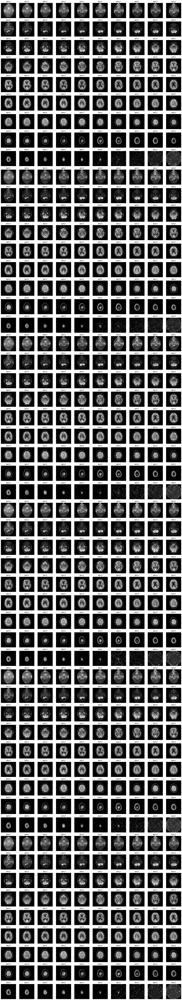

In [112]:
import matplotlib.pyplot as plt
import math
image_directory = test_path
 # Array containing titles corresponding to each image
# Get all filenames in the directory
filenames = os.listdir(image_directory)
# Sort filenames using regular expressions to sort numerically
sorted_filenames = sorted(filenames, key=lambda x: int(re.findall(r'\d+', x)[0]))

num_images = len(sorted_filenames)
num_cols = 10  # Number of columns
num_rows = math.ceil(num_images / num_cols)  # Calculate the number of rows needed

fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(20, num_rows * 2))  # Dynamic figsize based on num_rows

for ax_row, row_index in zip(axes, range(num_rows)):
    for ax, filename in zip(ax_row, sorted_filenames[row_index * num_cols:]):
        file_path = os.path.join(image_directory, filename)
        image = cv2.imread(file_path, cv2.IMREAD_GRAYSCALE)
        ax.imshow(image, cmap='gray')
        ax.set_title("INPUT")  # Set title from the results array
        ax.axis('off')  # Turn off axis

# Hide empty subplots if any
for i in range(num_images, num_rows * num_cols):
    axes.flatten()[i].axis('off')

plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()

Patient Name: 014_S_4615
Patient ID: 014_S_4615
Patient Birth Date: N/A
Patient Sex: M
Patient Age: N/A
Patient Weight: 88.45
Patient Address: N/A


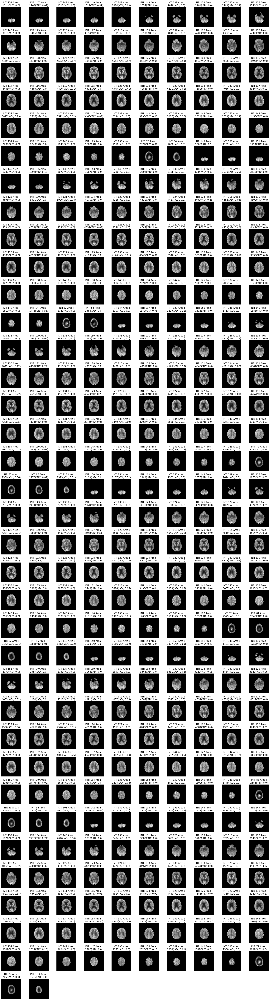

('AD', 0.0)


In [113]:
import matplotlib.pyplot as plt
import math
from textwrap import wrap
for key, value in patient_info.items():
    print(f"{key}: {value}")

image_directory = output_folder
 # Array containing titles corresponding to each image
# Get all filenames in the directory
filenames = os.listdir(image_directory)
# Sort filenames using regular expressions to sort numerically
sorted_filenames = sorted(filenames, key=lambda x: int(re.findall(r'\d+', x)[0]))

num_images = len(sorted_filenames)
num_cols = 10  # Number of columns
num_rows = math.ceil(num_images / num_cols)  # Calculate the number of rows needed

fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(20, num_rows * 2))  # Dynamic figsize based on num_rows

for ax_row, row_index in zip(axes, range(num_rows)):
    for ax, filename, intentsity, area, pred in zip(ax_row, sorted_filenames[row_index * num_cols:], result[row_index * num_cols:], areas[row_index * num_cols:], results[row_index * num_cols:]):
        file_path = os.path.join(image_directory, filename)
        image = cv2.imread(file_path, cv2.IMREAD_GRAYSCALE)
        ax.imshow(image, cmap='gray')
        title_l="INT: "+str(int(intentsity))+ " Area : " +str(int(area))+str(pred)
        wrapped_title = "\n".join(wrap(title_l, width=20))
        ax.set_title(wrapped_title)  # Set title from the results array
        ax.axis('off')  # Turn off axis

# Hide empty subplots if any
for i in range(num_images, num_rows * num_cols):
    axes.flatten()[i].axis('off')

plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()
print(results[0])

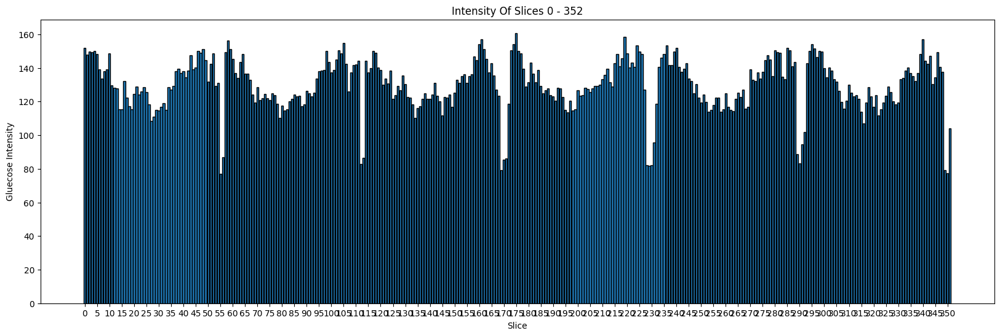

In [114]:

import matplotlib.pyplot as plt

def plot_histogram(data):
    plt.figure(figsize=(20, 6))  # Adjust the width and height of the figure as needed
    plt.bar(range(len(data)), data, align='center', edgecolor='black')
    plt.xlabel('Slice')
    plt.ylabel('Gluecose Intensity')
    plt.title('Intensity Of Slices 0 - '+str(len(data)))
    plt.xticks(range(0, len(data), 5))  # Set ticks at increments of 10
    plt.grid(False)
    plt.show()



plot_histogram(result)




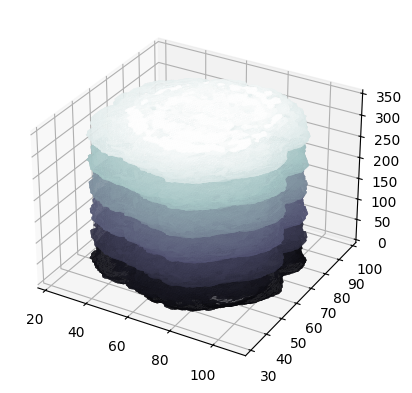

In [115]:
import skimage.io as io
import skimage.measure as measure
import os
import re
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
def load_images(directory):
    # Function to extract numerical index from the filename
    def extract_index(filename):
        match = re.search(r'(\d+)', filename)
        return int(match.group(1)) if match else -1

    # Sort files based on the extracted numerical index
    files = sorted(
        [os.path.join(directory, file) for file in os.listdir(directory) if file.endswith('.png')],
        key=lambda x: extract_index(os.path.basename(x))
    )
    
    images = [io.imread(file, as_gray=True) for file in files]
    volume = np.stack(images, axis=-1)
    return volume

def segment_brain(volume, percentile=90):
    threshold = np.percentile(volume, percentile)
    segmented = volume > threshold
    return segmented.astype(np.float32)
def natural_sort_key(s):
    """ Sort string in a human-readable way, handling numbers correctly. """
    return [int(text) if text.isdigit() else text.lower() for text in re.split('([0-9]+)', s)]

def rename_directory(directory_path):


    # Define the directory where your images are located
    directory = directory_path



    # Get a list of all the png files in the directory
    files = [f for f in os.listdir(directory) if f.endswith('.png')]

    # Sort the files by name, using natural sort
    files.sort(key=natural_sort_key)

    # Rename each file
    for i, filename in enumerate(files):
        new_name = f"{i}.png"
        os.rename(os.path.join(directory, filename), os.path.join(directory, new_name))

    return directory_path
    

def plot_3d(verts, faces):
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    ax.plot_trisurf(verts[:, 0], verts[:,1], faces, verts[:, 2], cmap='bone', lw=1)
    plt.show()

def extract_surface(volume, level=0.5):
    verts, faces, normals, values = measure.marching_cubes(volume, level=level)
    return verts, faces

def write_obj(filename, verts, faces):
    with open(filename, 'w') as file:
        for v in verts:
            file.write(f"v {v[0]} {v[1]} {v[2]}\n")
        for face in faces:
            file.write("f {} {} {}\n".format(face[0] + 1, face[1] + 1, face[2] + 1))

#threshold = int(input("Input Threshold: "))


volume = load_images(rename_directory(output_folder))
segmented_volume = segment_brain(volume, 90)
verts, faces = extract_surface(segmented_volume)
plot_3d(verts, faces)
write_obj("output_brain_model.obj", verts, faces)




In [116]:



delete_all_files(mask_folder)
delete_all_files(output_folder)
delete_all_files(outdir)